In [90]:
#https://huggingface.co/docs/transformers/en/model_doc/clip

In [8]:
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import numpy as np
import random
import glob
import torch
import os
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import json
import requests
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

<h2> Prepare folders 

In [3]:
#imagepath="Instagram_images/instagram_data/img"
images_paths = glob.glob("Instagram_images/instagram_data/img/*")
print (len(images_paths))

test_paths= glob.glob("clustering_2024/test_images/*")
print (len(test_paths))

20515
28


In [7]:
url= "https://huggingface.co/datasets/huggingface/label-files/raw/main/coco-detection-id2label.json"
response = requests.get(url)
coco_labels = json.loads(response.text)
labels_dict = {int(k): v for k, v in coco_labels.items()}

<h2>Import Clip

In [9]:
import transformers
from transformers import CLIPProcessor, CLIPModel
import torch
from PIL import Image

/Users/user/opt/miniconda3/envs/tf_clustering/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:
# Load CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")


In [20]:
#get feature embeddings for a single image

In [15]:
# Load an image
image = Image.open(test_paths[1])

# Get feature embeddings
inputs = processor(images=image, return_tensors="pt")
embeddings = model.get_image_features(**inputs)

print(embeddings.shape)  # High-dimensional feature vector

torch.Size([1, 512])


In [16]:
#tensors are typically converted to numpy
embeddings.detach().numpy().shape

(1, 512)

<h2> Training Data into Embeddings

In [30]:
clip_data_list=images_paths.copy()
random.shuffle(clip_data_list)
clipimage_path_list= clip_data_list[:500]

In [31]:
def extratct_image_embeddinings(pathlist):
    clipimage_path_list =pathlist
    clip_features=[]
    for path in clipimage_path_list:
        #print(path)
        image = Image.open(path)
        # Get feature embeddings
        inputs = processor(images=image, return_tensors="pt")
        embeddings = model.get_image_features(**inputs)
        clip_features.append(embeddings.detach().numpy())
        #print(embeddings.detach().numpy().shape)
    return clip_features   

In [32]:
clip_features= extratct_image_embeddinings(clipimage_path_list)
clip_features_np =np.array([i[0] for i in clip_features])

<h2> Cluster Feature Embeddings with KMeans

In [33]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [37]:
def cluster_embeddings(clip_features_for_clustering):
    clip_features_for_clustering =clip_features_np
    
    scaler = StandardScaler()
    features_scaled_clip = scaler.fit_transform(clip_features_for_clustering)
    
    # Apply K-Means clustering
    kmeans_clip = KMeans(n_clusters=10, random_state=42,max_iter=500)  # Set desired number of clusters
    clusters_clip = kmeans_clip.fit_predict(features_scaled_clip)
    
    return scaler, kmeans_clip, clusters_clip
    

In [38]:
scaler, kmeans_clip, clusters_clip = cluster_embeddings(clip_features_np)

/Users/user/opt/miniconda3/envs/tf_clustering/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [39]:
clusters_clip

array([2, 8, 0, 9, 7, 4, 8, 7, 2, 7, 9, 7, 2, 6, 9, 5, 2, 5, 7, 8, 4, 3,
       2, 2, 0, 3, 0, 8, 3, 9, 2, 9, 3, 8, 8, 2, 8, 8, 7, 4, 4, 0, 7, 2,
       4, 5, 9, 7, 1, 7, 8, 5, 2, 3, 8, 1, 4, 0, 7, 9, 3, 5, 3, 8, 1, 9,
       4, 2, 6, 6, 0, 6, 3, 7, 7, 8, 6, 7, 6, 7, 0, 5, 7, 0, 8, 3, 4, 4,
       9, 2, 1, 1, 7, 7, 8, 9, 2, 1, 2, 1, 7, 6, 9, 0, 1, 9, 3, 2, 9, 6,
       2, 8, 7, 3, 1, 1, 2, 0, 3, 2, 6, 7, 1, 6, 2, 8, 9, 6, 3, 5, 8, 2,
       2, 6, 2, 2, 7, 8, 8, 2, 8, 8, 9, 6, 8, 2, 4, 2, 7, 6, 1, 5, 2, 2,
       3, 3, 2, 8, 7, 3, 0, 0, 5, 8, 3, 7, 6, 2, 0, 1, 2, 6, 1, 2, 4, 7,
       2, 4, 7, 4, 9, 1, 3, 2, 1, 9, 2, 2, 8, 9, 1, 4, 5, 6, 6, 3, 7, 3,
       2, 2, 8, 2, 6, 2, 7, 7, 2, 8, 7, 2, 1, 0, 9, 9, 7, 3, 2, 3, 7, 3,
       9, 2, 8, 2, 2, 5, 9, 3, 0, 4, 8, 9, 8, 9, 2, 1, 2, 9, 5, 8, 7, 6,
       1, 2, 8, 1, 7, 6, 1, 3, 1, 2, 2, 9, 0, 6, 3, 2, 2, 4, 3, 8, 2, 6,
       6, 1, 4, 8, 8, 0, 2, 3, 8, 0, 0, 8, 2, 6, 3, 8, 8, 2, 4, 4, 1, 0,
       8, 2, 2, 4, 2, 1, 0, 4, 0, 1, 9, 8, 4, 9, 2,

<h2> Plot Images with Predicted Clusters 

In [44]:
#make Dictionory with clusters and image paths
image_clusters_clip = {clipimage_path_list[i]: clusters_clip[i] for i in range(len(clipimage_path_list))}

In [49]:
# Sort the dictionary by values (cluster numbers)
sorted_dict = dict(sorted(image_clusters_clip.items(), key=lambda x: x[1]))

In [45]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

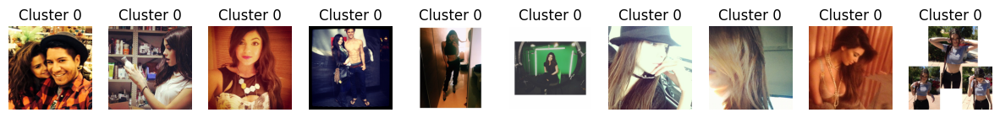

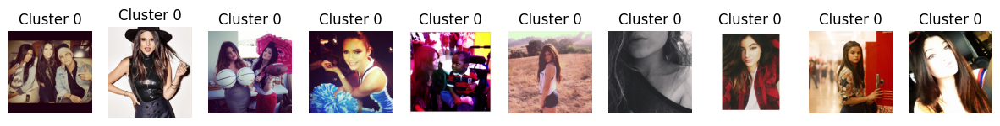

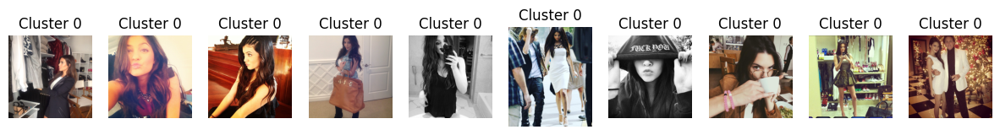

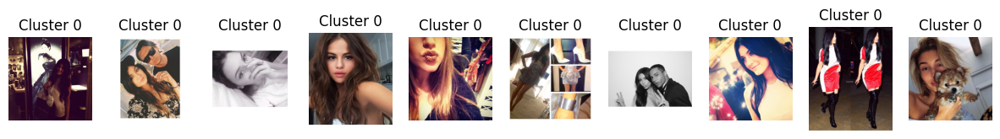

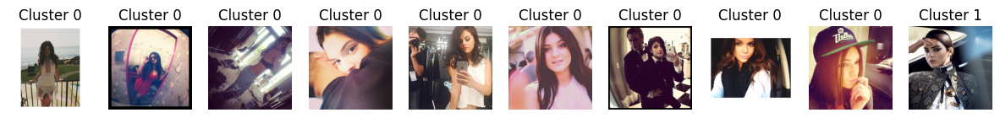

...

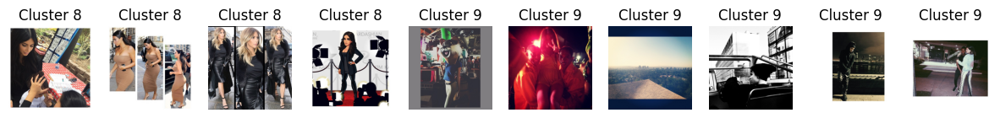

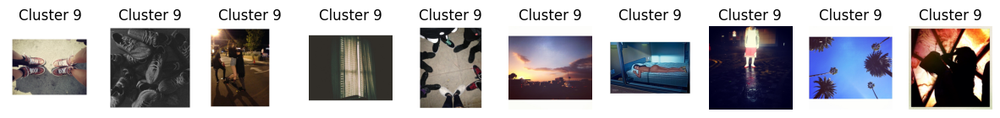

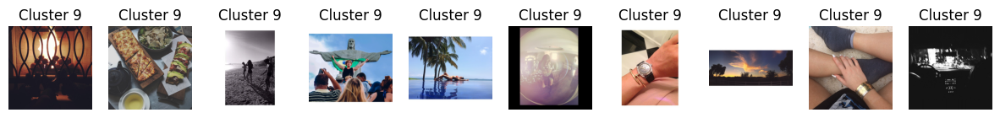

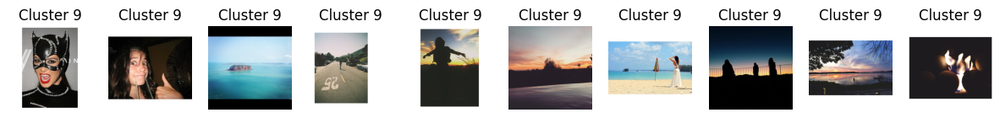

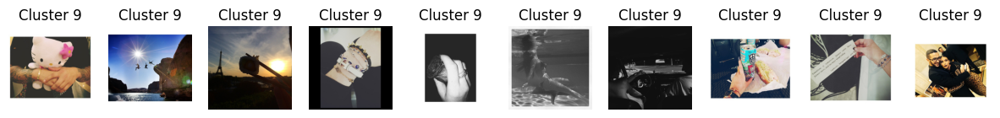

In [50]:
# Process images in batches
batch_size = 10
image_dict = sorted_dict   # Your image dictionary

for i in range(0, len(image_dict), batch_size):
#for i in range(0, 50, batch_size):
    batch_images = list(image_dict.keys())[i:i+batch_size]
    fig, axs = plt.subplots(1, len(batch_images), figsize=(15, 5))
    
    for j, ax in enumerate(axs):
        image_path = batch_images[j]
        cluster_label = image_dict[image_path]
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.set_title(f'Cluster {cluster_label}')
        ax.axis('off')
    
    plt.show()

<H2> Predict Test Images 

In [52]:
test_paths= glob.glob("test_images/*")

In [54]:
def extratct_image_embeddinings(pathlist):
    clipimage_path_list =pathlist
    clip_features=[]
    for path in clipimage_path_list:
        #print(path)
        image = Image.open(path)
        # Get feature embeddings
        inputs = processor(images=image, return_tensors="pt")
        embeddings = model.get_image_features(**inputs)
        clip_features.append(embeddings.detach().numpy())
        #print(embeddings.detach().numpy().shape)
    return clip_features  

In [55]:
test_clip_features= extratct_image_embeddinings(test_paths)
test_clip_features_np =np.array([i[0] for i in test_clip_features])


In [56]:
test_clip_features_np.shape

(28, 512)

In [65]:
def cluster_embeddings_predict(clip_features_for_clustering, clustering_scaler, clustering_model):
    
    #scale embeddings
    features_scaled_clip = clustering_scaler.fit_transform(clip_features_for_clustering)
    
    # Apply K-Means clustering
    predicted_clusters_clip = clustering_model.fit_predict(features_scaled_clip)
    
    return predicted_clusters_clip

In [66]:
 predicted_clusters_clip = cluster_embeddings_predict(test_clip_features_np, scaler, kmeans_clip)

/Users/user/opt/miniconda3/envs/tf_clustering/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [67]:
 len(predicted_clusters_clip)

28

<h2> Plot Test Images with Predicted Clusters 

In [70]:
#make Dictionory with clusters and image paths
test_image_clusters_clip = {test_paths[i]:  predicted_clusters_clip[i] for i in range(len(test_paths))}

In [71]:
# Sort the dictionary by values (cluster numbers)
test_sorted_dict = dict(sorted(test_image_clusters_clip.items(), key=lambda x: x[1]))

In [72]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

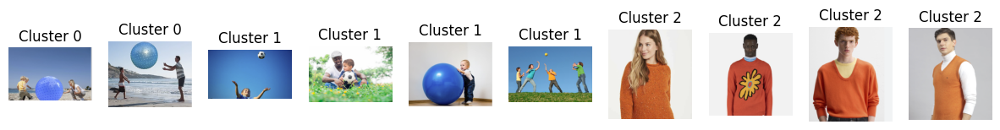

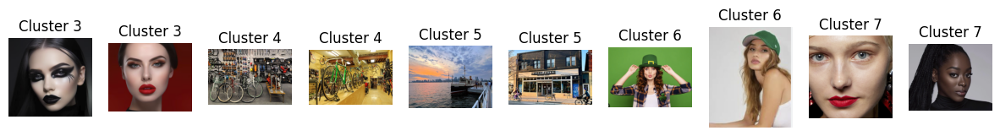

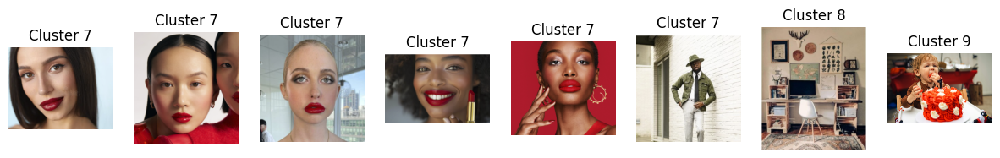

In [73]:
# Process images in batches
batch_size = 10
image_dict = test_sorted_dict   # Your image dictionary

for i in range(0, len(image_dict), batch_size):
#for i in range(0, 50, batch_size):
    batch_images = list(image_dict.keys())[i:i+batch_size]
    fig, axs = plt.subplots(1, len(batch_images), figsize=(15, 5))
    
    for j, ax in enumerate(axs):
        image_path = batch_images[j]
        cluster_label = image_dict[image_path]
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.set_title(f'Cluster {cluster_label}')
        ax.axis('off')
    
    plt.show()

<h2> Save the Model

In [74]:
from joblib import dump, load

# Save the KMeans model to a file
dump(kmeans_clip, 'kmeans_model_clip.joblib')
print("KMeans model saved successfully!")

KMeans model saved successfully!


In [75]:
# Load the saved KMeans model
kmeans_clip_loaded = load('kmeans_model_clip.joblib')
print("KMeans model loaded successfully!")

KMeans model loaded successfully!


In [76]:
 # Set desired number of clusters
loaded_feature_embeddings= test_clip_features_np
loaded_clusters = kmeans_clip_loaded.fit_predict(loaded_feature_embeddings)

/Users/user/opt/miniconda3/envs/tf_clustering/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [77]:
loaded_clusters

array([1, 5, 7, 5, 5, 0, 4, 3, 7, 3, 5, 2, 6, 9, 0, 1, 0, 7, 1, 9, 1, 2,
       4, 5, 4, 1, 7, 8], dtype=int32)

In [79]:
 # SWITCH models to local and check
loaded_feature_embeddings= test_clip_features_np
loaded_clusters = kmeans_clip.fit_predict(loaded_feature_embeddings)

/Users/user/opt/miniconda3/envs/tf_clustering/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [80]:
loaded_clusters 

array([1, 5, 7, 5, 5, 0, 4, 3, 7, 3, 5, 2, 6, 9, 0, 1, 0, 7, 1, 9, 1, 2,
       4, 5, 4, 1, 7, 8], dtype=int32)

<h2> Plot clusters using TSNE

In [82]:
test_clip_features_np.shape

(28, 512)

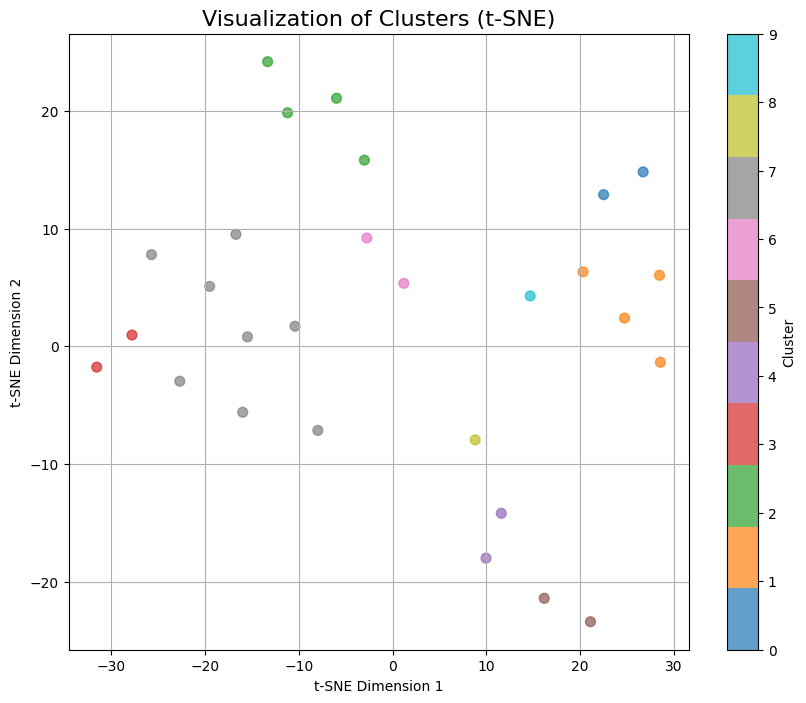

In [88]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Reduce features to 2D using t-SNE with a lower perplexity
tsne = TSNE(n_components=2, perplexity=10, random_state=42)
reduced_features_tsne = tsne.fit_transform(test_clip_features_np)

# Plot the clusters
plt.figure(figsize=(10, 8))
plt.scatter(
    reduced_features_tsne[:, 0], 
    reduced_features_tsne[:, 1], 
    c= predicted_clusters_clip ,  # Color by cluster label
    cmap='tab10', 
    s=50, 
    alpha=0.7
)
plt.title("Visualization of Clusters (t-SNE)", fontsize=16)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.colorbar(label="Cluster")
plt.grid()
plt.show()


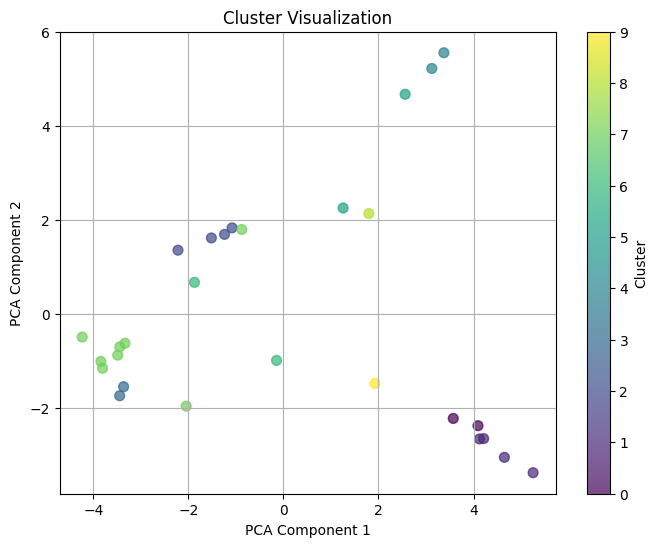

In [89]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce features to 2D using PCA
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(test_clip_features_np)

# Visualize clusters
plt.figure(figsize=(8, 6))
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=predicted_clusters_clip, cmap='viridis', s=50, alpha=0.7)
plt.title("Cluster Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Cluster")
plt.grid()
plt.show()
